# Регрессия на доходность трех месяцев

### Импорты

In [1]:
import numpy as np
import pandas as pd

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, r2_score
import shap

from scipy.stats import spearmanr, pearsonr, kendalltau

import warnings
warnings.filterwarnings("ignore")

### Датафрейм

In [2]:
path = '../../../data/final/pairs.csv'

data = pd.read_csv(path, index_col = 0)
data.head(3)

,views,forwards,thumb_up_react_cnt,thumb_down_react_cnt,mindblowing_react_cnt,heart_react_cnt,thinking_react_cnt,crying_react_cnt,fire_react_cnt,clap_react_cnt,...,free_bird_react_cnt_x_positive_div_by_days,snowman_react_cnt_x_positive_div_by_days,banana_react_cnt_x_positive_div_by_days,poop_react_cnt_x_positive_div_by_days,rofl_smile_react_cnt_x_positive_div_by_days,clown_smile_react_cnt_x_positive_div_by_days,devil_smile_react_cnt_x_positive_div_by_days,hundred_react_cnt_x_positive_div_by_days,head_arm_smile_react_cnt_x_positive_div_by_days,eyes_react_cnt_x_positive_div_by_days
0,63078,63,251,19,0,27,36,0,2,0,...,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0
1,63078,63,251,19,0,27,36,0,2,0,...,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0
2,63078,63,251,19,0,27,36,0,2,0,...,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0


In [3]:
cols = ['views',
 'forwards',
 'thumb_up_react_cnt',
 'thumb_down_react_cnt',
 'mindblowing_react_cnt',
 'heart_react_cnt',
 'thinking_react_cnt',
 'crying_react_cnt',
 'fire_react_cnt',
 'clap_react_cnt',
 'whale_react_cnt',
 'champaign_react_cnt',
 'heart_fire_react_cnt',
 'okay_react_cnt',
 'smile_stars_react_cnt',
 'smiling_react_cnt',
 'cheers_react_cnt',
 'lovely_smile_react_cnt',
 'drunk_smile_react_cnt',
 'angry_smile_react_cnt',
 'shicked_smile_react_cnt',
 'moos_smile_react_cnt',
 'hotdog_react_cnt',
 'free_bird_react_cnt',
 'snowman_react_cnt',
 'banana_react_cnt',
 'poop_react_cnt',
 'rofl_smile_react_cnt',
 'clown_smile_react_cnt',
 'devil_smile_react_cnt',
 'hundred_react_cnt',
 'head_arm_smile_react_cnt',
 'eyes_react_cnt',
 'days_before_ipo',
 'text_len',
 'price',
 'delta_price',
 'delta_perc',
 'open',
 'delta_open',
 'delta_perc_on_ipo_date',
 'positive_score',
 'views_x_positive',
 'forwards_x_positive',
 'thumb_up_react_cnt_x_positive',
 'thumb_down_react_cnt_x_positive',
 'mindblowing_react_cnt_x_positive',
 'heart_react_cnt_x_positive',
 'thinking_react_cnt_x_positive',
 'crying_react_cnt_x_positive',
 'fire_react_cnt_x_positive',
 'clap_react_cnt_x_positive',
 'whale_react_cnt_x_positive',
 'champaign_react_cnt_x_positive',
 'heart_fire_react_cnt_x_positive',
 'okay_react_cnt_x_positive',
 'smile_stars_react_cnt_x_positive',
 'smiling_react_cnt_x_positive',
 'cheers_react_cnt_x_positive',
 'lovely_smile_react_cnt_x_positive',
 'drunk_smile_react_cnt_x_positive',
 'angry_smile_react_cnt_x_positive',
 'shicked_smile_react_cnt_x_positive',
 'moos_smile_react_cnt_x_positive',
 'hotdog_react_cnt_x_positive',
 'free_bird_react_cnt_x_positive',
 'snowman_react_cnt_x_positive',
 'banana_react_cnt_x_positive',
 'poop_react_cnt_x_positive',
 'rofl_smile_react_cnt_x_positive',
 'clown_smile_react_cnt_x_positive',
 'devil_smile_react_cnt_x_positive',
 'hundred_react_cnt_x_positive',
 'head_arm_smile_react_cnt_x_positive',
 'eyes_react_cnt_x_positive',
 'views_div_by_days',
 'forwards_div_by_days',
 'thumb_up_react_cnt_div_by_days',
 'thumb_down_react_cnt_div_by_days',
 'mindblowing_react_cnt_div_by_days',
 'heart_react_cnt_div_by_days',
 'thinking_react_cnt_div_by_days',
 'crying_react_cnt_div_by_days',
 'fire_react_cnt_div_by_days',
 'clap_react_cnt_div_by_days',
 'whale_react_cnt_div_by_days',
 'champaign_react_cnt_div_by_days',
 'heart_fire_react_cnt_div_by_days',
 'okay_react_cnt_div_by_days',
 'smile_stars_react_cnt_div_by_days',
 'smiling_react_cnt_div_by_days',
 'cheers_react_cnt_div_by_days',
 'lovely_smile_react_cnt_div_by_days',
 'drunk_smile_react_cnt_div_by_days',
 'angry_smile_react_cnt_div_by_days',
 'shicked_smile_react_cnt_div_by_days',
 'moos_smile_react_cnt_div_by_days',
 'hotdog_react_cnt_div_by_days',
 'free_bird_react_cnt_div_by_days',
 'snowman_react_cnt_div_by_days',
 'banana_react_cnt_div_by_days',
 'poop_react_cnt_div_by_days',
 'rofl_smile_react_cnt_div_by_days',
 'clown_smile_react_cnt_div_by_days',
 'devil_smile_react_cnt_div_by_days',
 'hundred_react_cnt_div_by_days',
 'head_arm_smile_react_cnt_div_by_days',
 'eyes_react_cnt_div_by_days',
 'text_len_div_by_days',
 'positive_score_div_by_days',
 'views_x_positive_div_by_days',
 'forwards_x_positive_div_by_days',
 'thumb_up_react_cnt_x_positive_div_by_days',
 'thumb_down_react_cnt_x_positive_div_by_days',
 'mindblowing_react_cnt_x_positive_div_by_days',
 'heart_react_cnt_x_positive_div_by_days',
 'thinking_react_cnt_x_positive_div_by_days',
 'crying_react_cnt_x_positive_div_by_days',
 'fire_react_cnt_x_positive_div_by_days',
 'clap_react_cnt_x_positive_div_by_days',
 'whale_react_cnt_x_positive_div_by_days',
 'champaign_react_cnt_x_positive_div_by_days',
 'heart_fire_react_cnt_x_positive_div_by_days',
 'okay_react_cnt_x_positive_div_by_days',
 'smile_stars_react_cnt_x_positive_div_by_days',
 'smiling_react_cnt_x_positive_div_by_days',
 'cheers_react_cnt_x_positive_div_by_days',
 'lovely_smile_react_cnt_x_positive_div_by_days',
 'drunk_smile_react_cnt_x_positive_div_by_days',
 'angry_smile_react_cnt_x_positive_div_by_days',
 'shicked_smile_react_cnt_x_positive_div_by_days',
 'moos_smile_react_cnt_x_positive_div_by_days',
 'hotdog_react_cnt_x_positive_div_by_days',
 'free_bird_react_cnt_x_positive_div_by_days',
 'snowman_react_cnt_x_positive_div_by_days',
 'banana_react_cnt_x_positive_div_by_days',
 'poop_react_cnt_x_positive_div_by_days',
 'rofl_smile_react_cnt_x_positive_div_by_days',
 'clown_smile_react_cnt_x_positive_div_by_days',
 'devil_smile_react_cnt_x_positive_div_by_days',
 'hundred_react_cnt_x_positive_div_by_days',
 'head_arm_smile_react_cnt_x_positive_div_by_days',
 'eyes_react_cnt_x_positive_div_by_days']

target = '3m_price'

In [4]:
data = data[data[target].notnull()]

X = data[cols]
y = data[target]

### Results collection

In [5]:
results = pd.DataFrame(columns = ['MAPE', 'Spearman', 'Pearson', 'Kendall'])

### Baseline model

In [6]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.20, random_state=0)

In [7]:
model = LinearRegression()

model.fit(X_train, y_train)

y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)

In [8]:
# mape
mape_train = round(mean_absolute_error(y_train, y_pred_train), 4)
mape_test = round(mean_absolute_error(y_test, y_pred_test), 4)

# spearman
spear_train = round(spearmanr(y_train, y_pred_train)[0], 4)
spear_test = round(spearmanr(y_test, y_pred_test)[0], 4)

# pearson
pears_train = round(pearsonr(y_train, y_pred_train)[0], 4)
pears_test = round(pearsonr(y_test, y_pred_test)[0], 4)

# kendaltau
kendall_train = round(kendalltau(y_train, y_pred_train)[0], 4)
kendall_test = round(kendalltau(y_test, y_pred_test)[0], 4)

cur_res = {'MAPE' : mape_train,
          'Spearman' : spear_train,
          'Pearson' : pears_train,
          'Kendall' : kendall_train}

results = results.append(pd.Series(cur_res,  name = 'baseline_train'))

cur_res = {'MAPE' : mape_test,
          'Spearman' : spear_test,
          'Pearson' : pears_test,
          'Kendall' : kendall_test}

results = results.append(pd.Series(cur_res,  name = 'baseline_test'))
results

,MAPE,Spearman,Pearson,Kendall
baseline_train,0.1750,0.3581,0.4331,0.2641
baseline_test,0.1771,0.3406,0.3626,0.2520


### Feature selection

1. Null drop
2. Nonsense drop
3. Correlation drop
4. Manual linearization
5. Correlation drop

In [9]:
import sys
sys.path.insert(1, '../../pipeline')

import pipeline as pl

In [10]:
cols = X_train.columns
print(f'{len(cols)} features before pipeline')

143 features before pipeline


### Null drop

In [11]:
cols = pl.null_drop(X, cutoff = 0.5)
print(f'{len(cols)} features remain')

143 features remain


### Nonsense drop

In [12]:
cols = pl.nonsense_drop(X[cols], 0.9)
print(f'{len(cols)} features remain')

47 features remain


In [13]:
model = LinearRegression()

model.fit(X_train[cols], y_train)

y_pred_train = model.predict(X_train[cols])
y_pred_test = model.predict(X_test[cols])

In [14]:
# mape
mape_train = round(mean_absolute_error(y_train, y_pred_train), 4)
mape_test = round(mean_absolute_error(y_test, y_pred_test), 4)

# spearman
spear_train = round(spearmanr(y_train, y_pred_train)[0], 4)
spear_test = round(spearmanr(y_test, y_pred_test)[0], 4)

# pearson
pears_train = round(pearsonr(y_train, y_pred_train)[0], 4)
pears_test = round(pearsonr(y_test, y_pred_test)[0], 4)

# kendaltau
pears_train = round(pearsonr(y_train, y_pred_train)[0], 4)
pears_test = round(pearsonr(y_test, y_pred_test)[0], 4)

cur_res = {'MAPE' : mape_train,
          'Spearman' : spear_train,
          'Pearson' : pears_train,
          'Kendall' : kendall_train}

results = results.append(pd.Series(cur_res,  name = 'after_nonsense_drop_train'))

cur_res = {'MAPE' : mape_test,
          'Spearman' : spear_test,
          'Pearson' : pears_test,
          'Kendall' : kendall_test}

results = results.append(pd.Series(cur_res,  name = 'after_nonsense_drop_test'))
results

,MAPE,Spearman,Pearson,Kendall
baseline_train,0.1750,0.3581,0.4331,0.2641
baseline_test,0.1771,0.3406,0.3626,0.2520
after_nonsense_drop_train,0.1759,0.3489,0.4266,0.2641
after_nonsense_drop_test,0.1755,0.3409,0.4126,0.2520


### Soft correlation drop

In [15]:
cols = pl.corr_drop(X[cols], y,  0.8)
print(f'{len(cols)} features remain')

price (0.0228) was removed by open (0.0239)
delta_perc (0.0002) was removed by delta_price (0.0017)
delta_perc_on_ipo_date (0.0002) was removed by delta_price (0.0017)
heart_react_cnt_x_positive_div_by_days (0.0122) was removed by heart_react_cnt_div_by_days (0.0328)
smiling_react_cnt_x_positive_div_by_days (0.0034) was removed by smiling_react_cnt_div_by_days (0.009)
42 features remain


In [16]:
model = LinearRegression()

model.fit(X_train[cols], y_train)

y_pred_train = model.predict(X_train[cols])
y_pred_test = model.predict(X_test[cols])

In [17]:
# mape
mape_train = round(mean_absolute_error(y_train, y_pred_train), 4)
mape_test = round(mean_absolute_error(y_test, y_pred_test), 4)

# spearman
spear_train = round(spearmanr(y_train, y_pred_train)[0], 4)
spear_test = round(spearmanr(y_test, y_pred_test)[0], 4)

# pearson
pears_train = round(pearsonr(y_train, y_pred_train)[0], 4)
pears_test = round(pearsonr(y_test, y_pred_test)[0], 4)

# kendaltau
pears_train = round(pearsonr(y_train, y_pred_train)[0], 4)
pears_test = round(pearsonr(y_test, y_pred_test)[0], 4)

cur_res = {'MAPE' : mape_train,
          'Spearman' : spear_train,
          'Pearson' : pears_train,
          'Kendall' : kendall_train}

results = results.append(pd.Series(cur_res,  name = 'after_soft_correlation_drop_train'))

cur_res = {'MAPE' : mape_test,
          'Spearman' : spear_test,
          'Pearson' : pears_test,
          'Kendall' : kendall_test}

results = results.append(pd.Series(cur_res,  name = 'after_soft_correlation_drop_test'))
results

,MAPE,Spearman,Pearson,Kendall
baseline_train,0.1750,0.3581,0.4331,0.2641
baseline_test,0.1771,0.3406,0.3626,0.2520
after_nonsense_drop_train,0.1759,0.3489,0.4266,0.2641
after_nonsense_drop_test,0.1755,0.3409,0.4126,0.2520
after_soft_correlation_drop_train,0.1759,0.3489,0.4266,0.2641
after_soft_correlation_drop_test,0.1755,0.3410,0.4120,0.2520


### Manual linearization

In [18]:
best_funcs = []
for col in cols:
    res = pl.linearization(X_train[col], y_train)
    print(f'best func for {col} is {res[0]} ({np.round(res[1], 4)})')
    best_funcs.append(res[0])

best func for views is <ufunc 'sqrt'> (0.02)
best func for forwards is <function <lambda> at 0x7fa059c68700> (0.0699)
best func for thumb_up_react_cnt is <function <lambda> at 0x7fa0984d3e50> (0.0265)
best func for thumb_down_react_cnt is <function <lambda> at 0x7fa059c68700> (0.0185)
best func for heart_react_cnt is <function <lambda> at 0x7fa0984d3e50> (0.0178)
best func for thinking_react_cnt is <function <lambda> at 0x7fa0984d3e50> (0.0318)
best func for crying_react_cnt is <function <lambda> at 0x7fa0984d3e50> (-0.0024)
best func for fire_react_cnt is <ufunc 'square'> (0.0095)
best func for smiling_react_cnt is <ufunc 'sqrt'> (0.0174)
best func for days_before_ipo is <ufunc 'log'> (-0.3)
best func for text_len is <ufunc 'square'> (0.0342)
best func for delta_price is <function <lambda> at 0x7fa0984d3e50> (-0.0004)
best func for open is <ufunc 'log'> (-0.02)
best func for delta_open is <function <lambda> at 0x7fa059c688b0> (-0.0032)
best func for positive_score is <function <lambda

In [19]:
for i in range(len(cols)):
    X_train[cols[i]] = best_funcs[i](X_train[cols[i]])
    X_test[cols[i]] = best_funcs[i](X_test[cols[i]])

In [20]:
model = LinearRegression()

model.fit(X_train[cols], y_train)

y_pred_train = model.predict(X_train[cols])
y_pred_test = model.predict(X_test[cols])

In [21]:
# mape
mape_train = round(mean_absolute_error(y_train, y_pred_train), 4)
mape_test = round(mean_absolute_error(y_test, y_pred_test), 4)

# spearman
spear_train = round(spearmanr(y_train, y_pred_train)[0], 4)
spear_test = round(spearmanr(y_test, y_pred_test)[0], 4)

# pearson
pears_train = round(pearsonr(y_train, y_pred_train)[0], 4)
pears_test = round(pearsonr(y_test, y_pred_test)[0], 4)

# kendaltau
pears_train = round(pearsonr(y_train, y_pred_train)[0], 4)
pears_test = round(pearsonr(y_test, y_pred_test)[0], 4)

cur_res = {'MAPE' : mape_train,
          'Spearman' : spear_train,
          'Pearson' : pears_train,
          'Kendall' : kendall_train}

results = results.append(pd.Series(cur_res,  name = 'after_linearization_drop_train'))

cur_res = {'MAPE' : mape_test,
          'Spearman' : spear_test,
          'Pearson' : pears_test,
          'Kendall' : kendall_test}

results = results.append(pd.Series(cur_res,  name = 'after_linearization_drop_test'))
results

,MAPE,Spearman,Pearson,Kendall
baseline_train,0.1750,0.3581,0.4331,0.2641
baseline_test,0.1771,0.3406,0.3626,0.2520
after_nonsense_drop_train,0.1759,0.3489,0.4266,0.2641
after_nonsense_drop_test,0.1755,0.3409,0.4126,0.2520
after_soft_correlation_drop_train,0.1759,0.3489,0.4266,0.2641
after_soft_correlation_drop_test,0.1755,0.3410,0.4120,0.2520
after_linearization_drop_train,0.1980,0.3496,0.3322,0.2641
after_linearization_drop_test,0.1969,0.3332,0.3100,0.2520


### Hard correlation drop

In [22]:
cols = pl.corr_drop(X[cols], y,  0.3)
print(f'{len(cols)} features remain')

views (0.0189) was removed by forwards (0.0339)
heart_react_cnt (0.0155) was removed by thumb_up_react_cnt (0.0243)
thumb_up_react_cnt (0.0243) was removed by thinking_react_cnt (0.0336)
views_x_positive (0.0088) was removed by positive_score (0.0107)
thumb_up_react_cnt_x_positive (0.0016) was removed by positive_score (0.0107)
thinking_react_cnt_x_positive (0.0) was removed by heart_react_cnt_x_positive (0.0035)
forwards_div_by_days (0.0473) was removed by views_div_by_days (0.0556)
views_div_by_days (0.0556) was removed by thumb_up_react_cnt_div_by_days (0.0585)
thumb_down_react_cnt_div_by_days (0.026) was removed by thumb_up_react_cnt_div_by_days (0.0585)
heart_react_cnt_div_by_days (0.0328) was removed by thumb_up_react_cnt_div_by_days (0.0585)
thumb_up_react_cnt_div_by_days (0.0585) was removed by thinking_react_cnt_div_by_days (0.0595)
crying_react_cnt_div_by_days (0.0158) was removed by thinking_react_cnt_div_by_days (0.0595)
thinking_react_cnt_x_positive_div_by_days (0.0126) wa

In [23]:
model = LinearRegression()

model.fit(X_train[cols], y_train)

y_pred_train = model.predict(X_train[cols])
y_pred_test = model.predict(X_test[cols])

In [24]:
# mape
mape_train = round(mean_absolute_error(y_train, y_pred_train), 4)
mape_test = round(mean_absolute_error(y_test, y_pred_test), 4)

# spearman
spear_train = round(spearmanr(y_train, y_pred_train)[0], 4)
spear_test = round(spearmanr(y_test, y_pred_test)[0], 4)

# pearson
pears_train = round(pearsonr(y_train, y_pred_train)[0], 4)
pears_test = round(pearsonr(y_test, y_pred_test)[0], 4)

# kendaltau
pears_train = round(pearsonr(y_train, y_pred_train)[0], 4)
pears_test = round(pearsonr(y_test, y_pred_test)[0], 4)

cur_res = {'MAPE' : mape_train,
          'Spearman' : spear_train,
          'Pearson' : pears_train,
          'Kendall' : kendall_train}

results = results.append(pd.Series(cur_res,  name = 'after_hard_correlation_drop_train'))

cur_res = {'MAPE' : mape_test,
          'Spearman' : spear_test,
          'Pearson' : pears_test,
          'Kendall' : kendall_test}

results = results.append(pd.Series(cur_res,  name = 'after_hard_correlation_drop_test'))
results

,MAPE,Spearman,Pearson,Kendall
baseline_train,0.1750,0.3581,0.4331,0.2641
baseline_test,0.1771,0.3406,0.3626,0.2520
after_nonsense_drop_train,0.1759,0.3489,0.4266,0.2641
after_nonsense_drop_test,0.1755,0.3409,0.4126,0.2520
after_soft_correlation_drop_train,0.1759,0.3489,0.4266,0.2641
after_soft_correlation_drop_test,0.1755,0.3410,0.4120,0.2520
after_linearization_drop_train,0.1980,0.3496,0.3322,0.2641
after_linearization_drop_test,0.1969,0.3332,0.3100,0.2520
after_hard_correlation_drop_train,0.2016,0.3530,0.3137,0.2641
after_hard_correlation_drop_test,0.2002,0.3404,0.3026,0.2520


### Forward selection

In [25]:
train_df = X_train
train_df['target'] = y_train
model = LinearRegression

In [26]:
cols = pl.forward_selection_regression(train_df, cols, model, target='target', alpha_in=0.05)

В модель была добавлена переменная text_len_div_by_days, p-value: 0.0
В модель была добавлена переменная days_before_ipo, p-value: 0.0
В модель была добавлена переменная forwards, p-value: 0.0
В модель была добавлена переменная views_x_positive_div_by_days, p-value: 0.0
В модель была добавлена переменная thinking_react_cnt_div_by_days, p-value: 0.0
В модель была добавлена переменная open, p-value: 0.0
В модель была добавлена переменная text_len, p-value: 0.0
В модель была добавлена переменная positive_score, p-value: 0.0004
В модель была добавлена переменная thumb_down_react_cnt_x_positive_div_by_days, p-value: 0.0002
В модель была добавлена переменная smiling_react_cnt_x_positive, p-value: 0.0002
В модель была добавлена переменная forwards_x_positive, p-value: 0.0021


### Итоговые переменные

In [27]:
print(f'total params:{len(cols)}')
cols

total params:11


['text_len_div_by_days',
 'days_before_ipo',
 'forwards',
 'views_x_positive_div_by_days',
 'thinking_react_cnt_div_by_days',
 'open',
 'text_len',
 'positive_score',
 'thumb_down_react_cnt_x_positive_div_by_days',
 'smiling_react_cnt_x_positive',
 'forwards_x_positive']

### Model

In [28]:
model = LinearRegression()

model.fit(X_train[cols], y_train)

y_pred_train = model.predict(X_train[cols])
y_pred_test = model.predict(X_test[cols])

In [29]:
# mape
mape_train = round(mean_absolute_error(y_train, y_pred_train), 4)
mape_test = round(mean_absolute_error(y_test, y_pred_test), 4)

# spearman
spear_train = round(spearmanr(y_train, y_pred_train)[0], 4)
spear_test = round(spearmanr(y_test, y_pred_test)[0], 4)

# pearson
pears_train = round(pearsonr(y_train, y_pred_train)[0], 4)
pears_test = round(pearsonr(y_test, y_pred_test)[0], 4)

# kendaltau
pears_train = round(pearsonr(y_train, y_pred_train)[0], 4)
pears_test = round(pearsonr(y_test, y_pred_test)[0], 4)

cur_res = {'MAPE' : mape_train,
          'Spearman' : spear_train,
          'Pearson' : pears_train,
          'Kendall' : kendall_train}

results = results.append(pd.Series(cur_res,  name = 'model_train'))

cur_res = {'MAPE' : mape_test,
          'Spearman' : spear_test,
          'Pearson' : pears_test,
          'Kendall' : kendall_test}

results = results.append(pd.Series(cur_res,  name = 'model_test'))
results

,MAPE,Spearman,Pearson,Kendall
baseline_train,0.1750,0.3581,0.4331,0.2641
baseline_test,0.1771,0.3406,0.3626,0.2520
after_nonsense_drop_train,0.1759,0.3489,0.4266,0.2641
after_nonsense_drop_test,0.1755,0.3409,0.4126,0.2520
after_soft_correlation_drop_train,0.1759,0.3489,0.4266,0.2641
after_soft_correlation_drop_test,0.1755,0.3410,0.4120,0.2520
after_linearization_drop_train,0.1980,0.3496,0.3322,0.2641
after_linearization_drop_test,0.1969,0.3332,0.3100,0.2520
after_hard_correlation_drop_train,0.2016,0.3530,0.3137,0.2641
after_hard_correlation_drop_test,0.2002,0.3404,0.3026,0.2520


In [30]:
results.to_csv('results/3m_regression.csv')

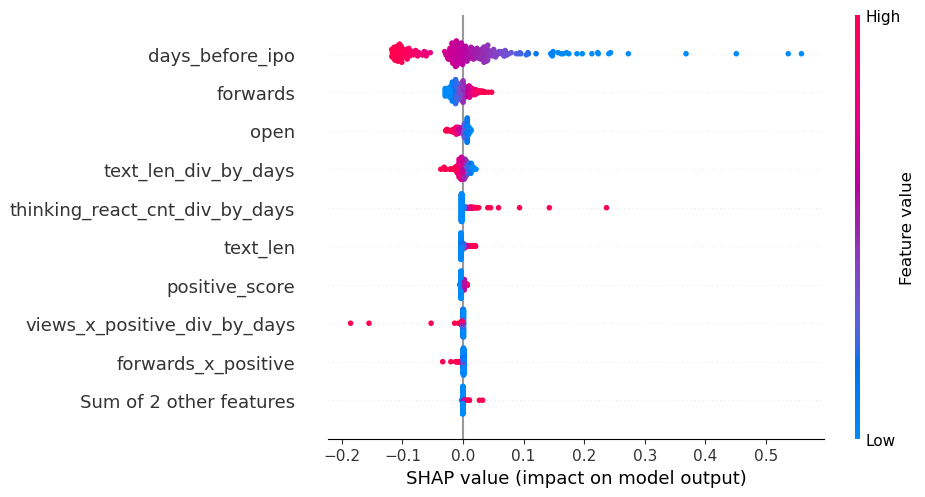

In [31]:
X100 = shap.utils.sample(X_train[cols], 300)

explainer = shap.Explainer(model.predict, X100)
shap_values = explainer(X100)
shap.plots.beeswarm(shap_values)

In [32]:
import statsmodels.api as sm

model = sm.OLS(y, X[cols])
results = model.fit()
results = results.summary()
results

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:               3m_price   R-squared (uncentered):                   0.212
Model:                            OLS   Adj. R-squared (uncentered):              0.212
Method:                 Least Squares   F-statistic:                              1022.
Date:                Sun, 05 May 2024   Prob (F-statistic):                        0.00
Time:                        12:26:43   Log-Likelihood:                         -5172.4
No. Observations:               41824   AIC:                                  1.037e+04
Df Residuals:                   41813   BIC:                                  1.046e+04
Df Model:                          11                                                  
Covariance Type:            nonrobust                                                  
===============================================================================================================
                                                  coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------------
text_len_div_by_days                            0.0003   4.45e-05      6.222      0.000       0.000       0.000
days_before_ipo                             -5.308e-05   1.02e-06    -52.153      0.000   -5.51e-05   -5.11e-05
forwards                                     7.093e-05   1.18e-05      6.002      0.000    4.78e-05    9.41e-05
views_x_positive_div_by_days                 3.453e-06   2.59e-06      1.331      0.183   -1.63e-06    8.54e-06
thinking_react_cnt_div_by_days                  0.0735      0.009      8.427      0.000       0.056       0.091
open                                            0.0028    4.9e-05     57.394      0.000       0.003       0.003
text_len                                     5.542e-05   1.33e-06     41.734      0.000    5.28e-05     5.8e-05
positive_score                                  0.0141      0.002      9.025      0.000       0.011       0.017
thumb_down_react_cnt_x_positive_div_by_days     0.0021      0.008      0.262      0.793      -0.013       0.018
smiling_react_cnt_x_positive                -3.989e-05   6.16e-05     -0.647      0.518      -0.000    8.09e-05
forwards_x_positive                          1.913e-05   1.15e-05      1.664      0.096   -3.41e-06    4.17e-05
==============================================================================
Omnibus:                     6461.267   Durbin-Watson:                   1.593
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            25107.584
Skew:                          -0.738   Prob(JB):                         0.00
Kurtosis:                       6.497   Cond. No.                     1.43e+04
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[3] The condition number is large, 1.43e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [33]:
import pickle
 
with open("results/3m_regression.pickle", "wb") as file:
    pickle.dump(results, file)

### Обзор вошедших переменных

In [34]:
cols

['text_len_div_by_days',
 'days_before_ipo',
 'forwards',
 'views_x_positive_div_by_days',
 'thinking_react_cnt_div_by_days',
 'open',
 'text_len',
 'positive_score',
 'thumb_down_react_cnt_x_positive_div_by_days',
 'smiling_react_cnt_x_positive',
 'forwards_x_positive']

#### days_before_ipo

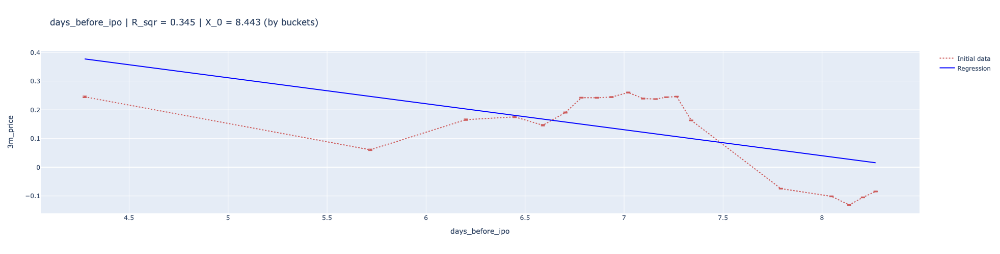

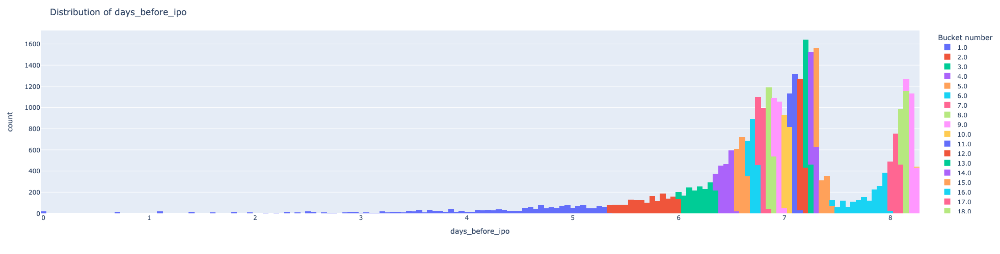

In [35]:
pl.bucket_line(X_train, y, n_buckets=20, feature_name='days_before_ipo', target_name=target, interactive = False)

#### forwards

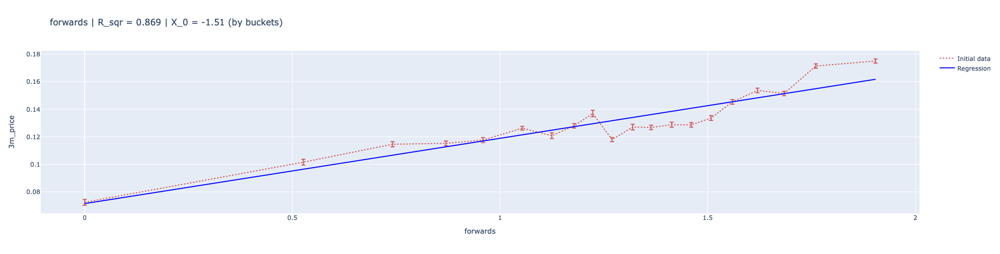

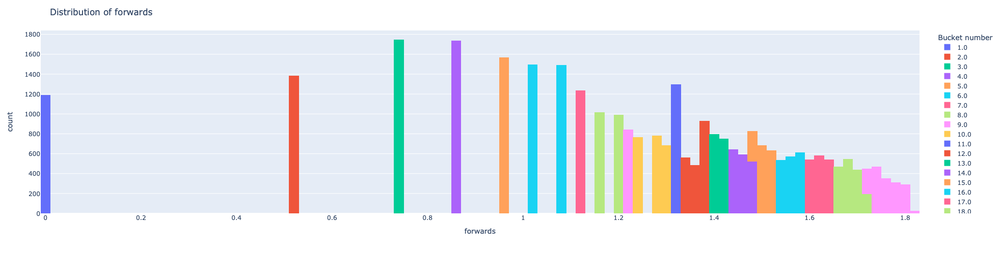

In [36]:
pl.bucket_line(np.log(X_train + 1), y, n_buckets=20, feature_name='forwards', target_name=target, interactive = False)

#### open

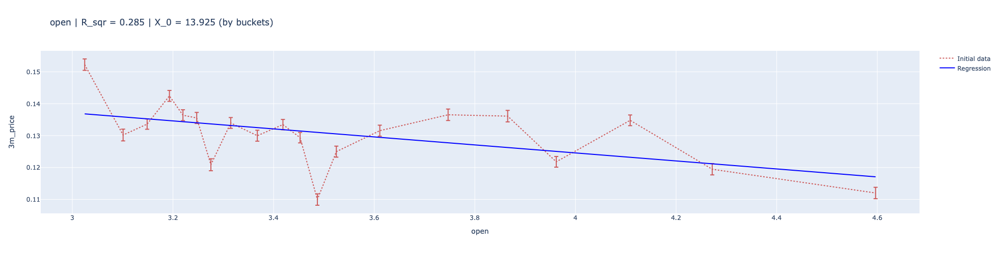

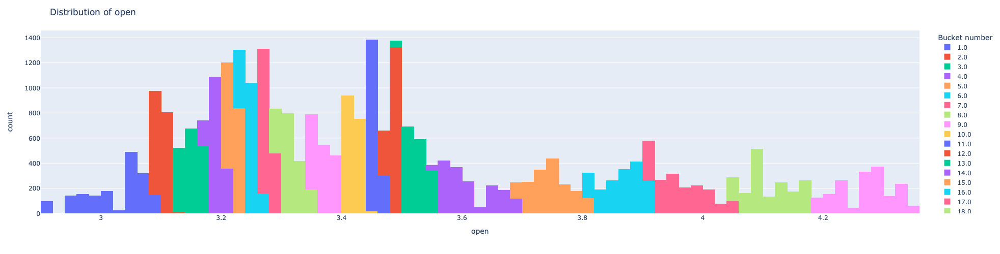

In [38]:
pl.bucket_line(X_train, y, n_buckets=20, feature_name='open', target_name=target, interactive = False)

#### text_len_div_by_days

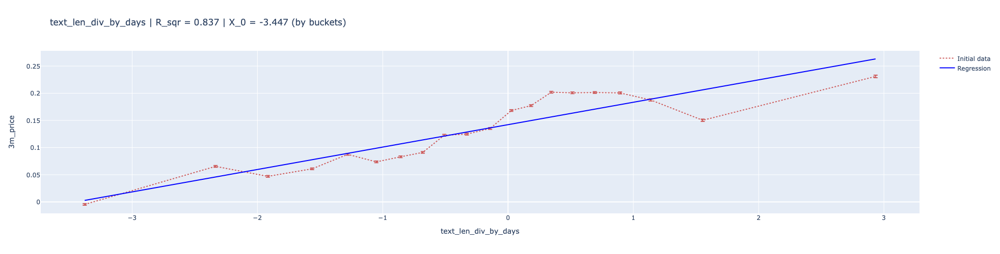

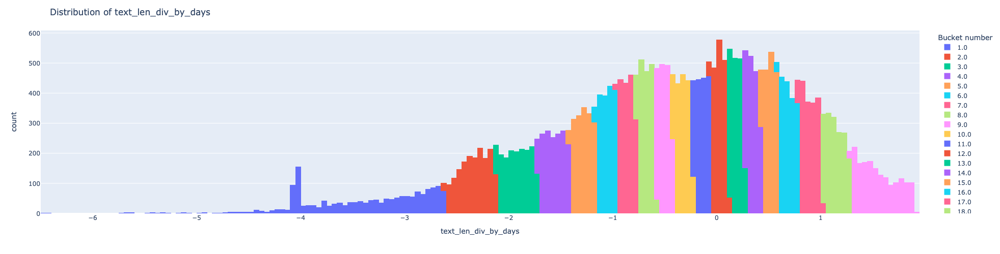

In [39]:
pl.bucket_line(X_train, y, n_buckets=20, feature_name='text_len_div_by_days', target_name=target, interactive = False)

#### thinking_react_cnt_div_by_days

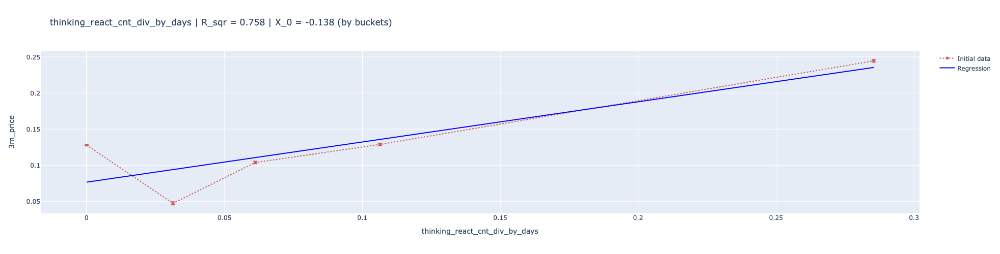

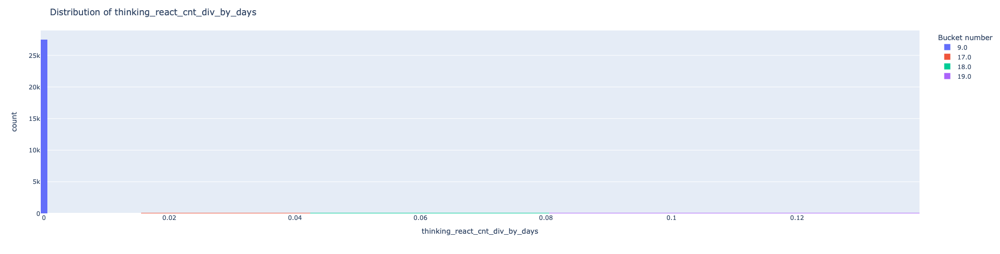

In [40]:
pl.bucket_line(X_train.clip(0, 10), y, n_buckets=20, feature_name='thinking_react_cnt_div_by_days', target_name=target, interactive = False)